In [5]:
import numpy as np
import pandas as pd
import os
import itertools
import glob
import re
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler
import matplotlib

In [6]:
NUMOFPARAMS = 10
OrderOfColumnsForTraining = ['lddt','fident', 'bits', 'alnlen', 'MismatchRatio', 'GapOpenRatio', 'tlen',
       'alntmscore', "FracOfPf","p_evalue", 'query', 'target','qstart',
       'qend', 'tstart', 'tend', 'qlen','PredPF', 'PF', 'PFstart', 'PFend', 'evalue', 'Status']

#It assumes all the parameters used for the training are located in the first columns of the X

In [7]:
from numpy import log
    
def PreprocessingLabeledData(df):
    """This is for calculating the pfam coverage, and replacing 0 e-values, it will also change
    the order of the columns. Before running this, the input must have been labeled. """
    df["FracOfPf"] = (df["tend"] -df["tstart"] + 1)/df["tlen"]
    df["p_evalue"] = -log(df["evalue"] + 1e-300)
    df["MismatchRatio"] = df["mismatch"]/df['alnlen'] *100
    df["GapOpenRatio"] = df["gapopen"]/df['alnlen'] *100
    df = df[OrderOfColumnsForTraining] #This is for putting the parameters
    # to learn from in the beginning, and for selecting the needed columns
    return df

In [8]:
LabeledDataAddressDict = {}
LabeledDataAdds = sorted(glob.glob("../intermediates/Tb/*_pf_e3_labeled.tsv"))[0]

In [9]:
%matplotlib inline

In [10]:
sns.set(rc={'figure.figsize':(8,6)})

In [11]:
TbData = pd.read_csv(LabeledDataAdds, sep="\t")
TbData = PreprocessingLabeledData(TbData)
LabeledData_tb = TbData[TbData["Status"]!=-1]
LabeledData_tb = LabeledData_tb.sample(frac=1, random_state=1).reset_index(drop=True)

X = LabeledData_tb.values
y = LabeledData_tb['Status'].values

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.6, test_size=0.4, shuffle=False)

In [14]:
X_train_demo = pd.DataFrame(X_train, columns=LabeledData_tb.columns)[['lddt','fident', 'bits', 'alnlen', 'MismatchRatio', 'GapOpenRatio', 'tlen',
       'alntmscore',"Status", "FracOfPf","p_evalue"]]
#    X_train[['fident', 'alnlen', 'mismatch', 'gapopen', 'qlen', 'bits',
#       'alntmscore', 'Status', 'FracOfPf', 'p_evalue']]
#'lddt','fident', 'bits', 'alnlen', 'MismatchRatio', 'GapOpenRatio', 'tlen',
#       'alntmscore', "FracOfPf","p_evalue"
X_train_demo.columns = ['lddt', "fident",'bit score', "alnlen", "nmismatch", "ngapopen","pflen", 
                       "TM-score", "Label", "pfcov","p_evalue" ]
#SelShort = X_train_demo.sample(frac=0.1)
sns.set(font_scale=2)
sns.set_style("white")

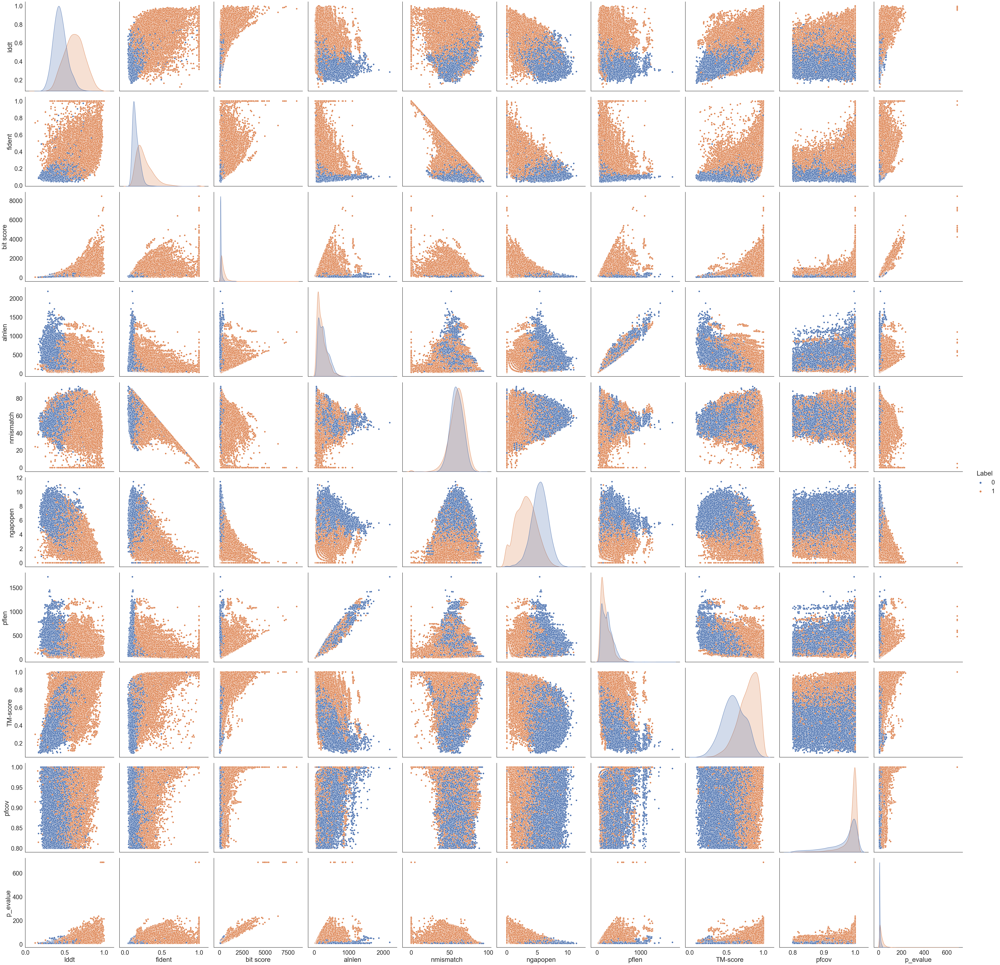

In [15]:
g = sns.pairplot(X_train_demo, hue = 'Label', diag_kws={'bw': 0.2}, height=5)